In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
!pip install -U openmim
!mim install mmcv-full

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50 kB 4.7 MB/s 
     |████████████████████████████████| 237 kB 61.2 MB/s 
     |████████████████████████████████| 51 kB 6.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html
     |████████████████████████████████| 43.7 MB 31.6 MB/s 
     |████████████████████████████████| 190 kB 28.8 MB/s 


In [ ]:
base = '/content/drive/Shareddrives/FYP-student-group/FYP-related/Code-colab/swin-inference/mmsegmentation/'

config_file = base + 'configs/swin/upernet_swin_tiny_patch4_window7_512x512_160k_loveda.py'
checkpoint_file = base + 'iter_32k.pth'

In [8]:
import sys
import os
sys.path.append(base)

from mmseg.apis import init_segmentor, inference_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

/content


/usr/local/lib/python3.7/dist-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


In [12]:
# build the model from a config file and a checkpoint file
model = init_segmentor(config_file, checkpoint_file, device='cuda')

/content/drive/Shareddrives/FYP-student-group/FYP-related/Code-colab/swin-inference/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/Shareddrives/FYP-student-group/FYP-related/Code-colab/swin-inference/mmsegmentation/iter_32k.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: backbone.layers.0.blocks.0.norm1.weight, backbone.layers.0.blocks.0.norm1.bias, backbone.layers.0.blocks.0.attn.relative_position_bias_table, backbone.layers.0.blocks.0.attn.relative_position_index, backbone.layers.0.blocks.0.attn.qkv.weight, backbone.layers.0.blocks.0.attn.qkv.bias, backbone.layers.0.blocks.0.attn.proj.weight, backbone.layers.0.blocks.0.attn.proj.bias, backbone.layers.0.blocks.0.norm2.weight, backbone.layers.0.blocks.0.norm2.bias, backbone.layers.0.blocks.0.mlp.fc1.weight, backbone.layers.0.blocks.0.mlp.fc1.bias, backbone.layers.0.blocks.0.mlp.fc2.weight, backbone.layers.0.blocks.0.mlp.fc2.bias, backbone.layers.0.blocks.1.norm1.weight, backbone.layers.0.blocks.1.norm1.bias, backbone.layers.0.blocks.1.attn.relative_position_bias_table, b

/content/drive/Shareddrives/FYP-student-group/FYP-related/Code-colab/swin-inference/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


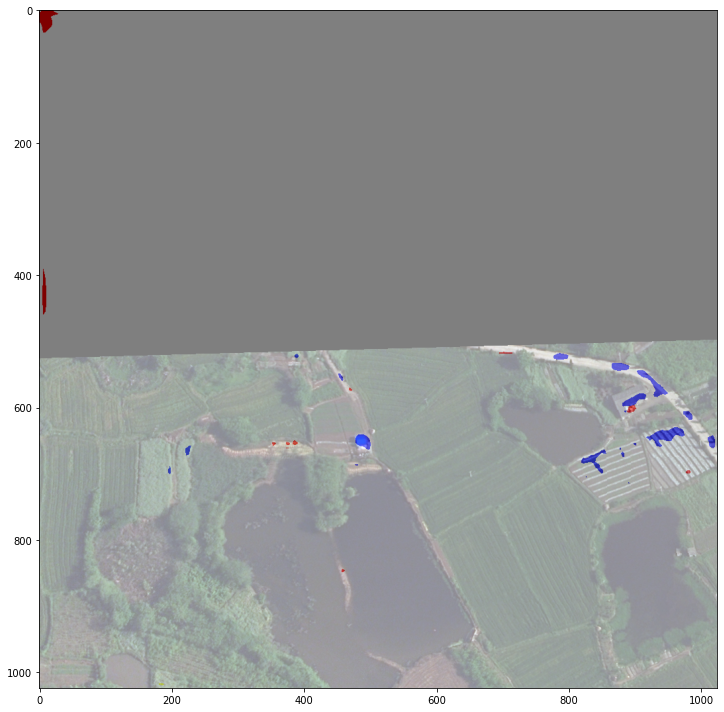

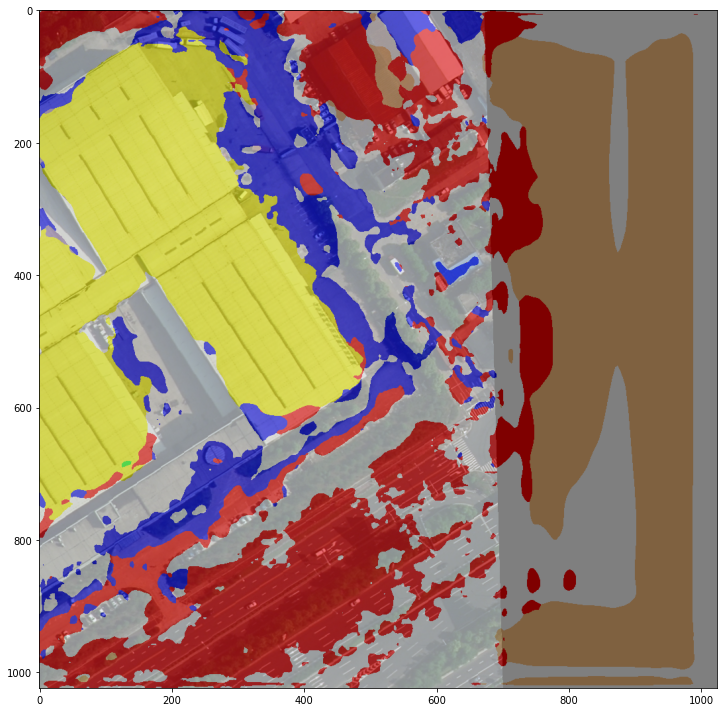

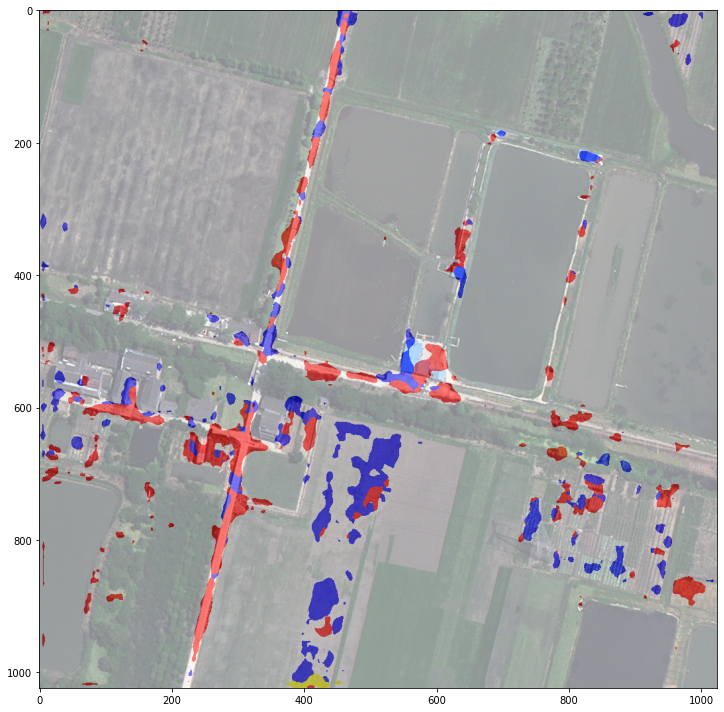

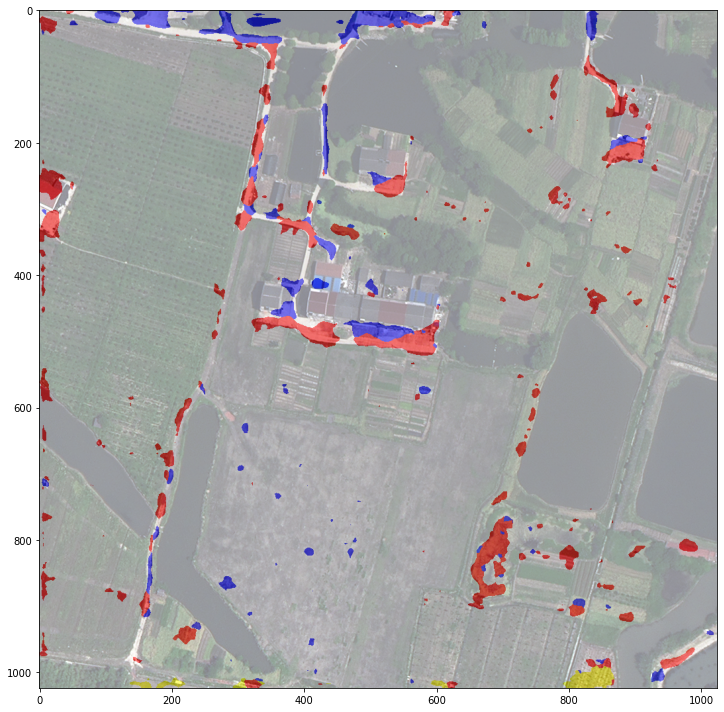

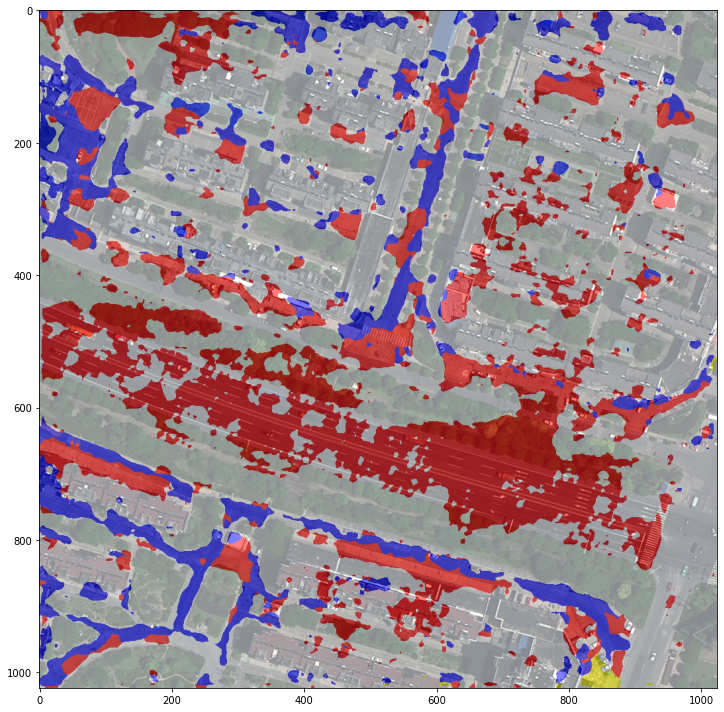

...

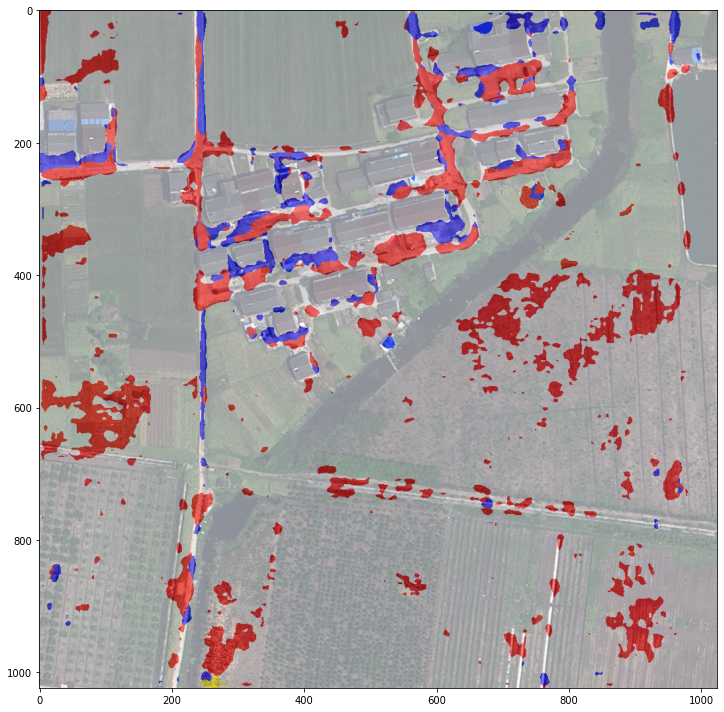

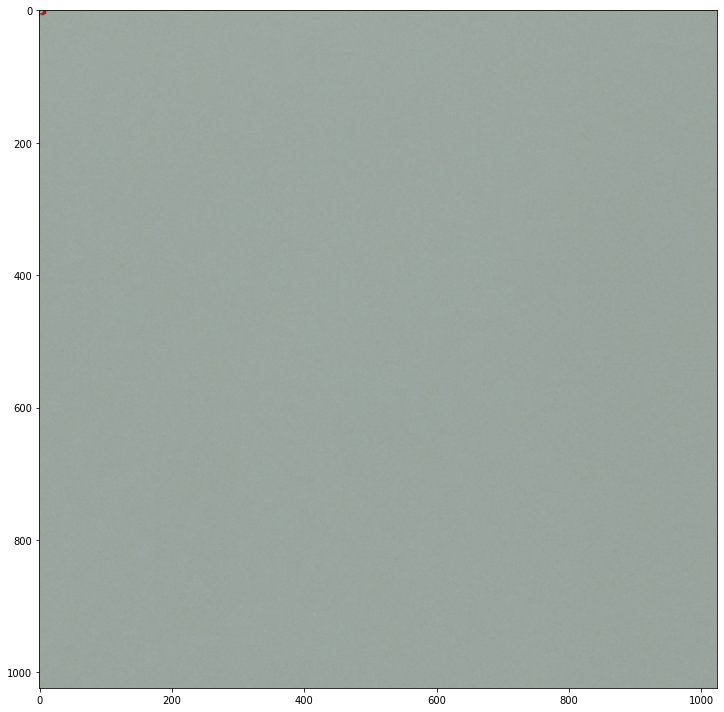

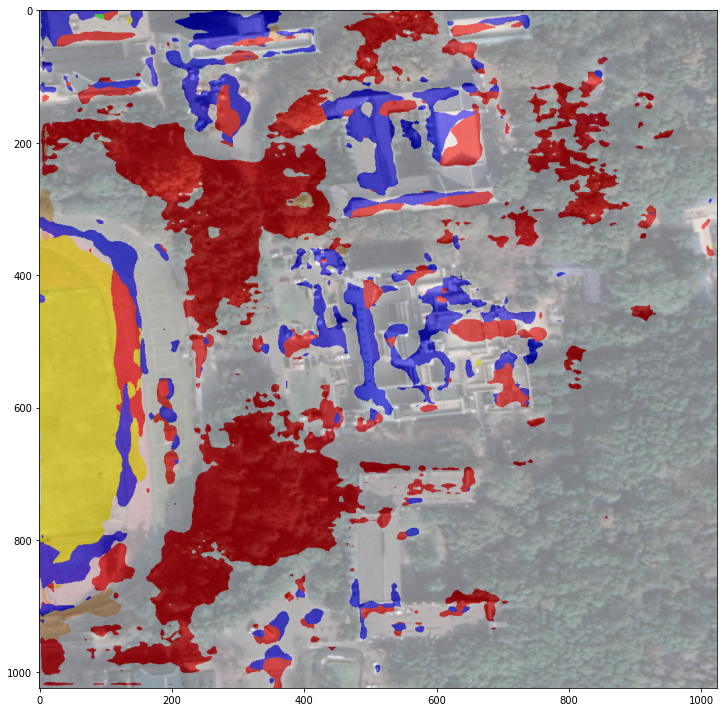

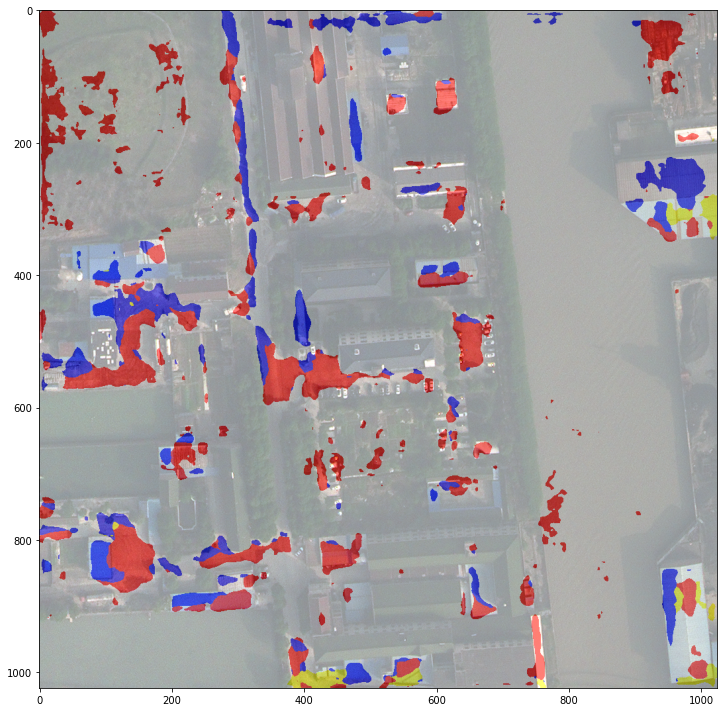

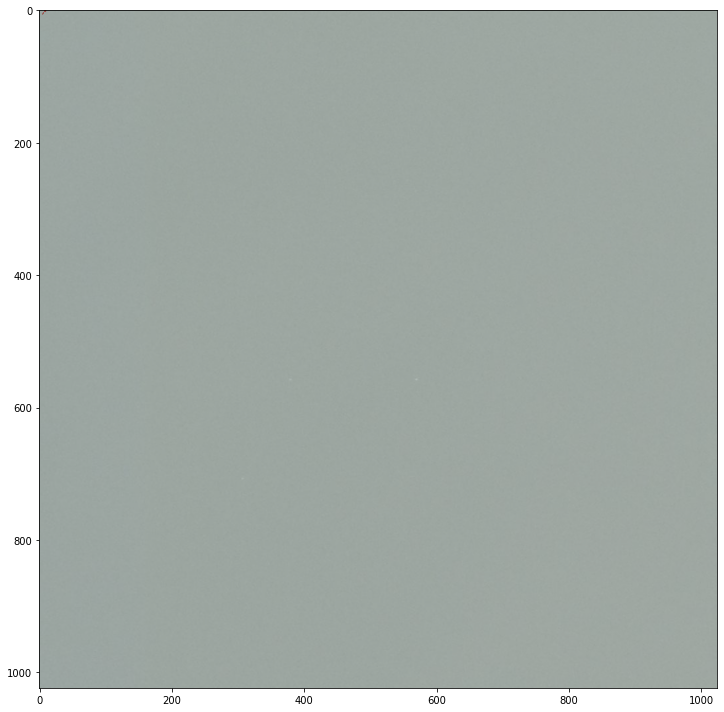

In [23]:
# test images
# show_result_pyplot(model, img, result, get_palette('cityscapes'))

images = ['4191.png', '4192.png', '4193.png', '4194.png', '4195.png', '4196.png', '4197.png', '4198.png', '4199.png', '4200.png', '5984.png', '5985.png']

for img in images:
  image_path = f'{base}data/{img}'
  output_path = f'{base}results/{img}'
  result = inference_segmentor(model, image_path)
  show_result_pyplot(model, image_path, result, get_palette('loveda'), out_file=output_path)
